## Assignment

Download dan Ekstrak Dataset: https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Train kembali dataset cat_dog ini menggunakan efficientnetv2 (dari handson image classification)

1. Mengunduh dataset:

In [ ]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip

--2023-11-03 13:15:51--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.4.207, 142.251.10.207, 142.251.12.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.4.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M  20.4MB/s    in 4.0s    

2023-11-03 13:15:56 (16.3 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



2. Mengekstrak dataset:

In [ ]:
import os
import zipfile

local_zip = '/tmp/cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

3. Menyiapkan path ke gambar:

In [ ]:
base_dir = '/tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

4. Menampilkan beberapa nama file:

In [ ]:
train_cat_fnames = os.listdir(train_cats_dir)
print(train_cat_fnames[:10])

train_dog_fnames = os.listdir(train_dogs_dir)
train_dog_fnames.sort()
print(train_dog_fnames[:10])

['cat.749.jpg', 'cat.106.jpg', 'cat.632.jpg', 'cat.953.jpg', 'cat.57.jpg', 'cat.746.jpg', 'cat.49.jpg', 'cat.577.jpg', 'cat.308.jpg', 'cat.917.jpg']
['dog.0.jpg', 'dog.1.jpg', 'dog.10.jpg', 'dog.100.jpg', 'dog.101.jpg', 'dog.102.jpg', 'dog.103.jpg', 'dog.104.jpg', 'dog.105.jpg', 'dog.106.jpg']


In [ ]:
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total training dog images:', len(os.listdir(train_dogs_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))
print('total validation dog images:', len(os.listdir(validation_dogs_dir)))

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500


5. Memvisualisasikan beberapa gambar:

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

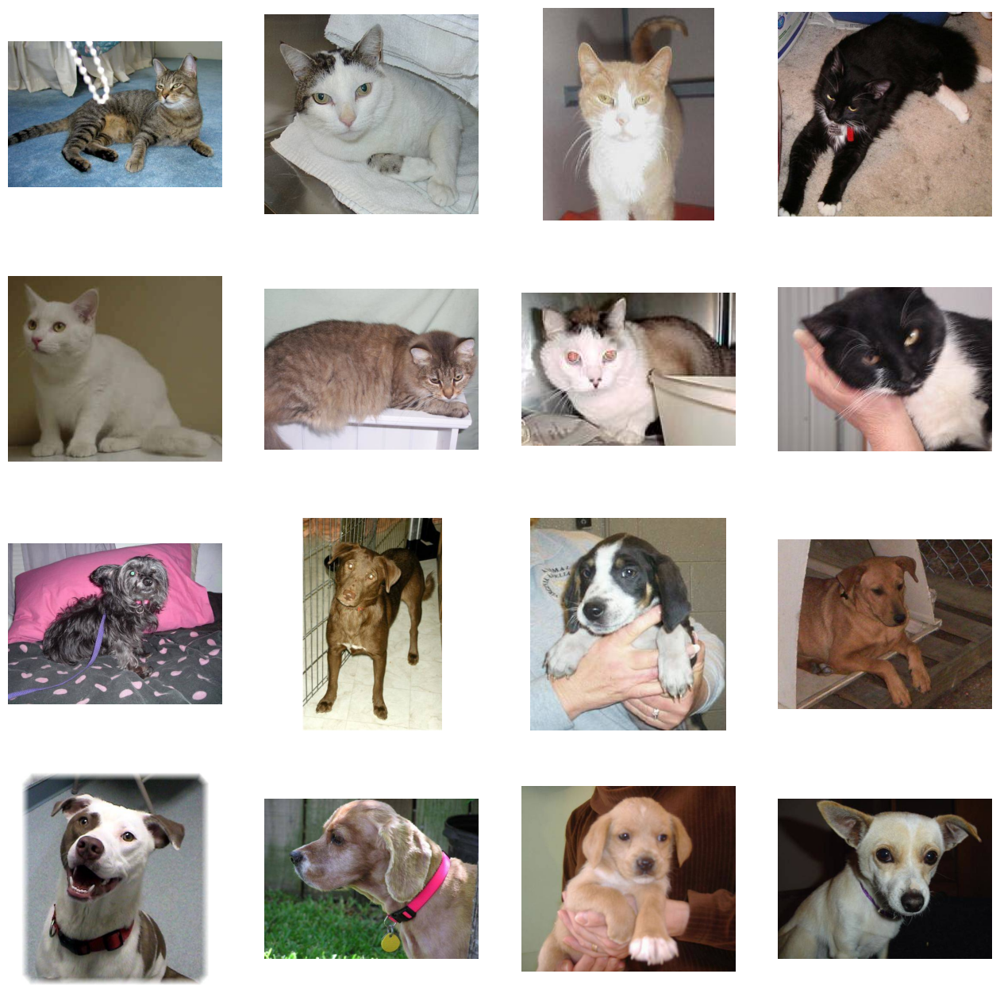

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_cat_pix = [os.path.join(train_cats_dir, fname)
                for fname in train_cat_fnames[pic_index-8:pic_index]]
next_dog_pix = [os.path.join(train_dogs_dir, fname)
                for fname in train_dog_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

6. Preprocessing, Augmentasi, Training dengan Efficientnetv2 dan plotting

Melakukan preprosesing gambar dengan mengubah skalanya, melakukan augmentasi data dengan rotasi gambar, lalu mengubah data dengan generator, selanjutnya mendefinisikan model yaitu menggunakan EfficientNetV2S, kompilasi, dan training model, selanjutnya mengambil nilai nilai untuk plot confusion matrix, selain itu melakukan plot pada tensorboard juga.

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
82420632/82420632 [==============================] - 4s 0us/step


Epoch 1/15
100/100 - 57s - loss: 0.7040 - acc: 0.5555 - val_loss: 0.6540 - val_acc: 0.6340 - 57s/epoch - 567ms/step
Epoch 2/15
100/100 - 18s - loss: 0.6736 - acc: 0.5815 - val_loss: 0.6425 - val_acc: 0.6360 - 18s/epoch - 184ms/step
Epoch 3/15
100/100 - 29s - loss: 0.6690 - acc: 0.5935 - val_loss: 0.6460 - val_acc: 0.6250 - 29s/epoch - 290ms/step
Epoch 4/15
100/100 - 26s - loss: 0.6613 - acc: 0.5890 - val_loss: 0.6331 - val_acc: 0.6500 - 26s/epoch - 263ms/step
Epoch 5/15
100/100 - 21s - loss: 0.6518 - acc: 0.6250 - val_loss: 0.6332 - val_acc: 0.6470 - 21s/epoch - 210ms/step
Epoch 6/15
100/100 - 21s - loss: 0.6658 - acc: 0.5990 - val_loss: 0.6348 - val_acc: 0.6520 - 21s/epoch - 211ms/step
Epoch 7/15
100/100 - 21s - loss: 0.6539 - acc: 0.6100 - val_loss: 0.6307 - val_acc: 0.6670 - 21s/epoch - 211ms/step
Epoch 8/15
100/100 - 26s - loss: 0.6569 - acc: 0.6105 - val_loss: 0.6368 - val_acc: 0.6350 - 26s/epoch - 257ms/step
Epoch 9/15
100/100 - 18s - loss: 0.6526 - acc: 0.6150 - val_loss: 0.6309

Text(95.72222222222221, 0.5, 'Truth')

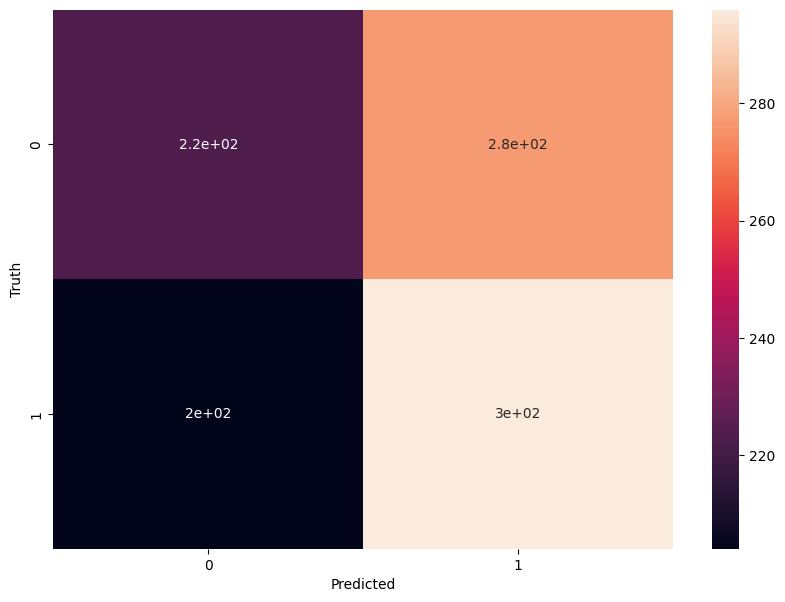

In [ ]:
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2S
from tensorflow.keras.callbacks import TensorBoard
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop
import numpy as np

# Preprocessing and Data Augmentation
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=20)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

validation_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

# Define Model
base_model = EfficientNetV2S(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_model.trainable = False

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
output = layers.Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile Model
model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['acc'])

# Define TensorBoard
tensorboard_callback = TensorBoard(log_dir='./logs')

# Train Model
history = model.fit(
      train_generator,
      steps_per_epoch=100,
      epochs=15,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2,
      callbacks=[tensorboard_callback])

# Predict classes using the model
y_pred = model.predict(validation_generator, steps=50)
y_pred_classes = (y_pred > 0.5).astype('int32')

# Get true classes from the validation generator
y_true_classes = np.array([])
for _, labels in validation_generator:
    y_true_classes = np.append(y_true_classes, labels)
    if len(y_true_classes) >= len(y_pred_classes):
        break

# Compute confusion matrix
cm = confusion_matrix(y_true_classes[:len(y_pred_classes)], y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>